In [ ]:
!pip install corner

### Visualizing the observable's distributions

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
z = np.random.beta(3,9) * 10 # Redshifts range = 0 to 10

In [ ]:
z

2.393562504946096

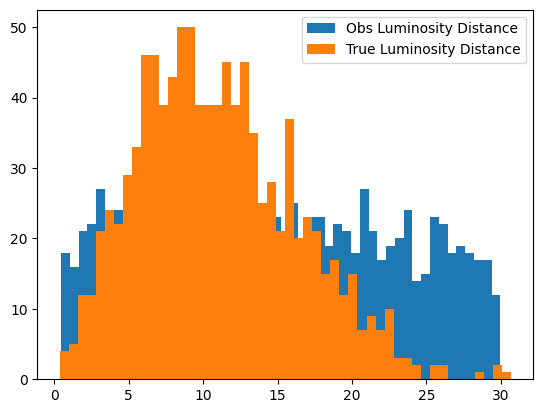

In [ ]:
c = 3e5 # km/s
h = 70 # km/s/MPc
Nobs = 1000
z = np.random.beta(3,9,Nobs) * 10
Dl = (c * z)/h #MPc
Dl_true = Dl/1000.0 #GPc
z1 = np.random.uniform(0.1,7.0,Nobs)
Dl_obs = (Dl_true/z) * z1
plt.hist( Dl_obs, bins = 50, label = 'Obs Luminosity Distance' )
plt.hist( Dl_true, bins = 50, label = 'True Luminosity Distance' )
plt.legend()
plt.show()

In [ ]:
min(z)

np.float64(0.19062521209830335)

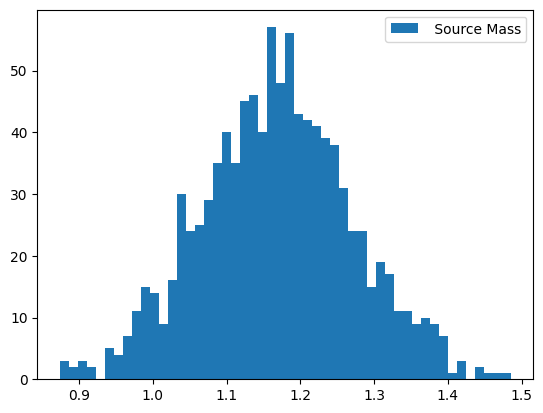

In [ ]:
mu_p_true = 1.17
sigma_p_true = 0.1
M_source_true = np.random.normal(mu_p_true, sigma_p_true, Nobs)
plt.hist( M_source_true, bins = 50, label = ' Source Mass' )
plt.legend()
plt.show()

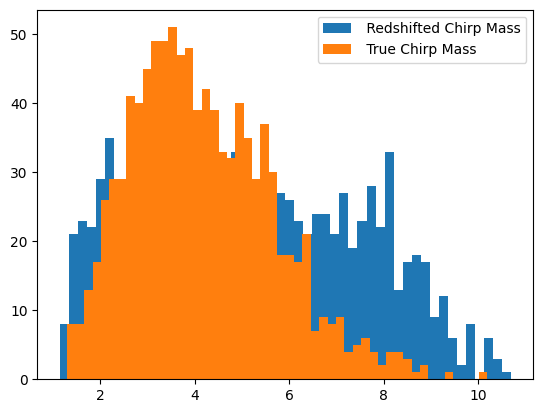

In [ ]:
Mz_true = (1+z)*M_source_true
Mz_obs = (1+z1)*M_source_true
plt.hist( Mz_obs, bins = 50, label = ' Redshifted Chirp Mass' )
plt.hist( Mz_true, bins = 50, label = ' True Chirp Mass' )
plt.legend()
plt.show()

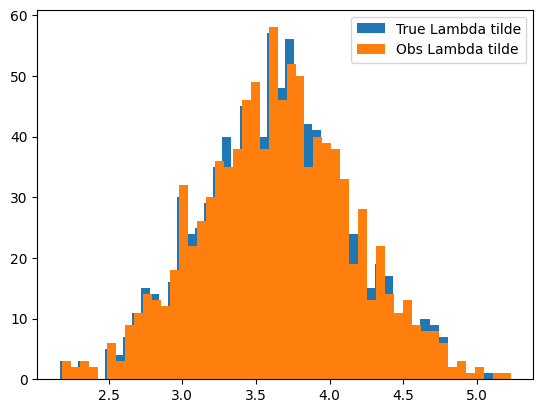

In [ ]:
c0_true = 4.8
c1_true = 5.0
Lambda_true = (c0_true + c1_true*((M_source_true - 1.4)/1.0))
sigma_Lambda =0.01
Lambda_obs = np.random.normal(Lambda_true, sigma_Lambda)
plt.hist( Lambda_true, bins = 50, label = 'True Lambda tilde' )
plt.hist( Lambda_obs, bins = 50, label = 'Obs Lambda tilde' )
plt.legend()
plt.show()

### Mother Likelihood Equation

Posterior ∝ Prior * Likelihood

Posterior ∝ P(Θ) * Likelihood

Now Likelihood =

$$
\text{Li} = \iiint d\mathcal{M}_z \, dD_L \, d\tilde{\Lambda} \;
P(D_{L,obs}, \mathcal{M}_{z,obs}, \tilde{\Lambda}_{obs} \mid D_L, \mathcal{M}_z, \tilde{\Lambda})
$$

$$
\quad \cdot \delta\left( \tilde{\Lambda} - \hat{\tilde{\Lambda}}\left( \frac{\mathcal{M}_z}{1 + z(D_L, \text{Cos})}, \text{EoS} \right) \right)
$$

$$
\quad \cdot f(D_L) \cdot \frac{1}{1 + z(D_L, \text{Cos})} \cdot
\mathcal{N}\left( \frac{\mathcal{M}_z}{1 + z(D_L, \text{Cos})} \mid \text{Pop} \right)
$$

### FOR NO-NOISE DATA OF LUMINOSITY DISTANCE AND CHIRP MASS

$$
\text{Li} =  \iint d\mathcal{M}_z\, dD_L \cdot
\delta(D_L^{\text{obs}} - D_L) \cdot \delta(\mathcal{M}_z^{\text{obs}} - \mathcal{M}_z) \cdot
\mathcal{N}\left(\tilde{\Lambda}^{\text{obs}} \mid \hat{\tilde{\Lambda}}\left( \frac{\mathcal{M}_z}{1 + z(D_L, \cos)}, \text{EoS} \right),\sigma_{\tilde\Lambda_{\text{obs}}} \right)
$$

$$
\quad \cdot \frac{1}{1 + z(D_L, \cos)} \cdot P(D_L)
\cdot \mathcal{N}\left( \frac{\mathcal{M}_z}{1 + z(D_L, \cos)} \,\middle|\, \mathcal{M}_p, \delta_p \right)
$$

---

$$
\text{Li} =  
\mathcal{N}\left(\tilde{\Lambda}^{\text{obs}} \mid \hat{\tilde{\Lambda}}\left( \frac{\mathcal{M}_{z\text{obs}}}{1 + z(D_{L\text{obs}}, \cos)}, \text{EoS} \right),\sigma_{\tilde\Lambda_{\text{obs}}} \right)
\cdot \frac{1}{1 + z(D_{L\text{obs}}, \cos)} \cdot \left.\frac{dz}{dD_L}\right|_{D_{L\text{obs}}} \cdot P(z)
$$

$$
\quad \cdot \mathcal{N}\left( \frac{\mathcal{M}_{z\text{obs}}}{1 + z(D_{L\text{obs}}, \cos)} \,\middle|\, \mathcal{M}_p, \delta_p \right)
$$

**Assumption:**

$$
P(D_L) = \left.\frac{dz}{dD_L}\right|_{D_{L\text{obs}}} \cdot P(z)
$$

---

**Total Likelihood**

$$
\mathcal{L} = \prod_{i = 1}^{n}  
\mathcal{N}\left(\tilde{\Lambda}^{\text{obs}}_i \mid \hat{\tilde{\Lambda}}\left( \frac{\mathcal{M}_{z\text{obs},i}}{1 + z(D_{L\text{obs},i}, \cos)}, \text{EoS} \right),\sigma_{\tilde\Lambda_{\text{obs},i}} \right)
$$

$$
\cdot \frac{1}{1 + z(D_{L\text{obs},i}, \cos)} \cdot \left.\frac{dz}{dD_L}\right|_{D_{L\text{obs},i}} \cdot P(z_i)
\cdot \mathcal{N}\left( \frac{\mathcal{M}_{z\text{obs},i}}{1 + z(D_{L\text{obs},i}, \cos)} \,\middle|\, \mathcal{M}_p, \delta_p \right)
$$

---

**Log-Likelihood**

$$
\log \mathcal{L} = \sum_{i = 1}^{n} \log\left[
\mathcal{N}\left(\tilde{\Lambda}^{\text{obs}}_i \mid \hat{\tilde{\Lambda}}\left( \frac{\mathcal{M}_{z\text{obs},i}}{1 + z(D_{L\text{obs},i}, \cos)}, \text{EoS} \right),\sigma_{\tilde\Lambda_{\text{obs},i}} \right)
\right]
$$

$$
+ \log\left(\frac{1}{1 + z(D_{L\text{obs},i}, \cos)}\right)
+ \log\left(\left.\frac{dz}{dD_L}\right|_{D_{L\text{obs},i}}\right)
+ \log\left(P(z_i)\right)
+ \log\left[
\mathcal{N}\left( \frac{\mathcal{M}_{z\text{obs},i}}{1 + z(D_{L\text{obs},i}, \cos)} \,\middle|\, \mathcal{M}_p, \delta_p \right)
\right]
$$

Output()

           mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
H0       69.859  0.119  69.638   70.087      0.002    0.001    4509.0   
mu_p      1.170  0.002   1.167    1.174      0.000    0.000    4648.0   
sigma_p   0.011  0.001   0.009    0.012      0.000    0.000    4905.0   
c0        4.788  0.022   4.747    4.829      0.000    0.000    3203.0   
c1       -5.091  0.091  -5.262   -4.917      0.002    0.001    3329.0   

         ess_tail  r_hat  
H0         4563.0    1.0  
mu_p       4848.0    1.0  
sigma_p    5024.0    1.0  
c0         4172.0    1.0  
c1         4268.0    1.0  


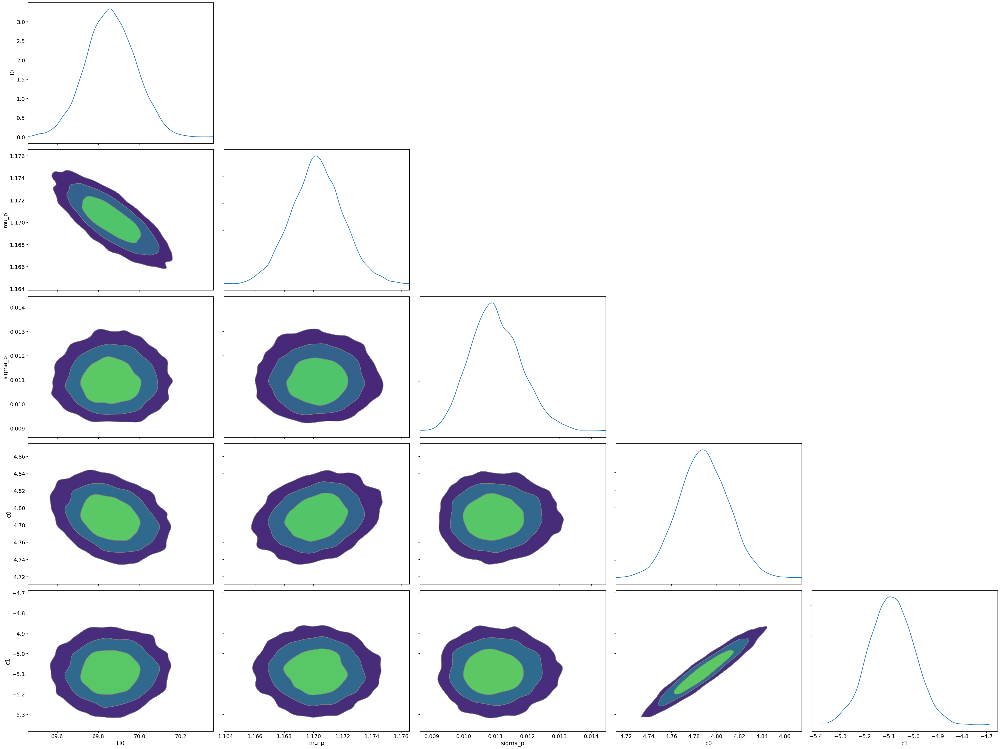

In [ ]:
####PYMC MODEL BLOCK FOR ONLY H0 IN COS####


# IMPORTED MODULES
import pymc as pm
import pytensor.tensor as pt
import pytensor.tensor.extra_ops as pte
import numpy as np
from scipy.stats import beta
from pytensor import grad
import matplotlib.pyplot as plt
import arviz as az
from astropy.cosmology import Planck18 as cosmo
from astropy import units as u
#FUNCTIONS

def Ez(z, Om, w, wDM):
    opz = 1 + z
    return pt.sqrt(Om*opz**(3*(1+wDM)) + (1-Om)*opz**(3*(1+w)))


def dCs(zs, Om, w, wDM):
    dz = zs[1:] - zs[:-1]
    fz = 1 / Ez(zs, Om, w, wDM)
    I = 0.5 * dz * (fz[:-1] + fz[1:])
    return pt.concatenate([pt.as_tensor([0.0]), pt.cumsum(I)])

def dLs(zs, dCs):
    return dCs * (1 + zs)

def dDLdz(zs, Om, w, wDM):
    dc_vals = dCs(zs, Om, w, wDM)
    ez_vals = Ez(zs, Om, w, wDM)
    return dc_vals + (1 + zs) / ez_vals

def pt_interp(x, xs, ys):
    x = pt.as_tensor(x)
    xs = pt.as_tensor(xs)
    ys = pt.as_tensor(ys)
    ind = pte.searchsorted(xs, x)
    ind = pt.clip(ind, 1, xs.shape[0] - 1)
    r = (x - xs[ind - 1]) / (xs[ind] - xs[ind - 1])
    return r * ys[ind] + (1 - r) * ys(ind - 1)
#MOCK DATA GENERATION
Nobs = 100
z_true = np.random.beta(3,9,Nobs) * 10
DL_true = (z_true*3e5)/70.0
mu_p_true = 1.17
sigma_p_true = 0.01
M_source_true = np.random.normal(mu_p_true, sigma_p_true, size=Nobs)
Mz_true = (1 + z_true) * M_source_true
c0_true = 4.8
c1_true = -5.0
Lambda_true = c0_true + c1_true * ((M_source_true - 1.4) / 1.0)
sigma_lambda = 0.01
Lambda_obs = np.random.normal(Lambda_true, sigma_lambda)
DL_obs = DL_true
Mz_obs = Mz_true

#Redshift grid (numeric)
z_grid_np = np.linspace(1e-4, 10.0, 2000).astype(np.float32)

#PYMC MODEL BLOCK FOR ONLY H0 IN COS

### true value plot + prior plot (separately by numpy) + posterior (with corner.py)

with pm.Model() as model:

    H0 = pm.Uniform("H0", 50.0, 120.0)

    mu_p = pm.Uniform("mu_p", 0.5, 2.0)
    sigma_p = pm.Uniform("sigma_p", 0.0, 0.5)

    c0 = pm.Uniform("c0", 2.0, 6.0)
    c1 = pm.Uniform("c1", -7.0, -3.0)

    DL_obs_shared = pm.Data("DL_obs", DL_obs)
    Mz_obs_shared = pm.Data("Mz_obs", Mz_obs)
    Lambda_obs_shared = pm.Data("Lambda_obs", Lambda_obs)

    dL_grid = DL_obs_shared
    z_grid = ((dL_grid*H0)/(3.0e5))

    dz_grid = z_grid[1:] - z_grid[:-1]             # forward diff
    dL_diff = dL_grid[1:] - dL_grid[:-1]
    ddl_dz_grid = dL_diff / dz_grid                # derivative
    ddl_dz_grid = pt.concatenate([ddl_dz_grid, ddl_dz_grid[-1:]])  # pad to same length

    dz_dDL = 1.0 / ddl_dz_grid

    M_source = Mz_obs_shared / (1.0 + z_grid)

    Lambda_pred = c0 + c1 * ((M_source - 1.4) / 1.0)

    logL1 = pm.logp(pm.Normal.dist(mu=Lambda_pred, sigma=sigma_lambda), Lambda_obs_shared)
    logL2 = -pt.log1p(z_grid)
    logL3 = pt.log(dz_dDL)
    z_grid = pt.clip((z_grid/10.0), 1e-5, 1-1e-5) # Clip to avoid boundary issues
    logL4 = pm.logp(pm.Beta.dist(3, 9), z_grid)
    logL5 = pm.logp(pm.Normal.dist(mu=mu_p, sigma=sigma_p), M_source)

    total_loglike = logL1 + logL2 + logL3 + logL4 + logL5
    pm.Potential("loglike", pt.sum(total_loglike))
    #model.debug()
    initvals = {
        "H0": 70.0,
        "mu_p": 1.17,
        "sigma_p": 0.1,
        "c0": 4.8,
        "c1": -5.0,
    }

    trace = pm.sample(5000, tune=2000, chains=2, target_accept=0.99, initvals=initvals)

#OUTPUT FOR ONLY H0 IN COS
summary = az.summary(trace, var_names=["H0",  "mu_p", "sigma_p", "c0", "c1"])
print(summary)
az.plot_pair(trace, var_names=["H0",  "mu_p", "sigma_p", "c0", "c1"], kind="kde", marginals=True)
plt.tight_layout()
plt.show()

In [ ]:
# IMPORTED MODULES
import pymc as pm
import pytensor.tensor as pt
import pytensor.tensor.extra_ops as pte
import numpy as np
from scipy.stats import beta
from pytensor import grad
import matplotlib.pyplot as plt
import arviz as az
from astropy.cosmology import Planck18 as cosmo
from astropy import units as u


In [ ]:
#FUNCTIONS

def Ez(z, Om, w, wDM):
    opz = 1 + z
    return pt.sqrt(Om*opz**(3*(1+wDM)) + (1-Om)*opz**(3*(1+w)))


def dCs(zs, Om, w, wDM):
    dz = zs[1:] - zs[:-1]
    fz = 1 / Ez(zs, Om, w, wDM)
    I = 0.5 * dz * (fz[:-1] + fz[1:])
    return pt.concatenate([pt.as_tensor([0.0]), pt.cumsum(I)])

def dLs(zs, dCs):
    return dCs * (1 + zs)

def dDLdz(zs, Om, w, wDM):
    dc_vals = dCs(zs, Om, w, wDM)
    ez_vals = Ez(zs, Om, w, wDM)
    return dc_vals + (1 + zs) / ez_vals

def pt_interp(x, xs, ys):
    x = pt.as_tensor(x)
    xs = pt.as_tensor(xs)
    ys = pt.as_tensor(ys)
    ind = pte.searchsorted(xs, x)
    ind = pt.clip(ind, 1, xs.shape[0] - 1)
    r = (x - xs[ind - 1]) / (xs[ind] - xs[ind - 1])
    return r * ys[ind] + (1 - r) * ys[ind - 1]

In [ ]:
#MOCK DATA GENERATION
Nobs = 100
z_true = np.random.beta(3,9,Nobs) * 10
DL_true = cosmo.luminosity_distance(z_true).to(u.Mpc).value
mu_p_true = 1.17
sigma_p_true = 0.01
M_source_true = np.random.normal(mu_p_true, sigma_p_true, size=Nobs)
Mz_true = (1 + z_true) * M_source_true
c0_true = 4.8
c1_true = -5.0
Lambda_true = c0_true + c1_true * ((M_source_true - 1.4) / 1.0)
sigma_lambda = 0.01
Lambda_obs = np.random.normal(Lambda_true, sigma_lambda)
DL_obs = DL_true
Mz_obs = Mz_true

#Redshift grid (numeric)
z_grid_np = np.linspace(1e-4, 10.0, 100).astype(np.float32)

In [ ]:
#PYMC MODEL BLOCK # WITHOUT USING DERIVATIVE FUNCTION

with pm.Model() as model:

    # Priors
    H0 = pm.Uniform("H0", 50.0, 120.0)
    Om = pm.Uniform("Om", 0.1, 0.5)
    w = pm.Uniform("w", -2.0, -0.01)
    wDM = 0.0

    mu_p = pm.Uniform("mu_p", 0.5, 2.0)
    sigma_p = pm.Uniform("sigma_p", 0.0, 0.5)

    c0 = pm.Uniform("c0", 2.0, 6.0)
    c1 = pm.Uniform("c1", -7, -3)

    # z grid and luminosity distance
    z_grid = pt.as_tensor_variable(z_grid_np)
    dC_grid = dCs(z_grid, Om, w, wDM)
    dL_grid = (dLs(z_grid, dC_grid) * 3e5)/H0

    # derivative dD_L/dz
    dz_grid = z_grid[1:] - z_grid[:-1]             # forward diff
    dL_diff = dL_grid[1:] - dL_grid[:-1]
    ddl_dz_grid = dL_diff / dz_grid                # derivative
    ddl_dz_grid = pt.concatenate([ddl_dz_grid, ddl_dz_grid[-1:]])  # pad to same length

    #Observed data
    DL_obs_shared = pm.Data("DL_obs", DL_obs)
    Mz_obs_shared = pm.Data("Mz_obs", Mz_obs)
    Lambda_obs_shared = pm.Data("Lambda_obs", Lambda_obs)

    #Interpolate z from DL
    z_interp = pt_interp(DL_obs_shared, dL_grid, z_grid)

    #Interpolate derivative
    ddl_dz_interp = pt_interp(z_interp, z_grid, ddl_dz_grid)
    dz_dDL = 1.0 / ddl_dz_interp

    #Source mass
    M_source = Mz_obs_shared / (1.0 + z_interp)

    #Lambda
    Lambda_pred = c0 + c1 * ((M_source - 1.4) / 1.0)

    pm.Deterministic("z_interp", z_interp)
    #pm.Deterministic("dz_dDL", dz_dDL)
    #pm.Deterministic("Lambda_pred", Lambda_pred)

    #Log-likelihood
    logL1 = pm.logp(pm.Normal.dist(mu=Lambda_pred, sigma=sigma_lambda), Lambda_obs_shared)
    logL2 = -pt.log1p(z_interp)
    logL3 = pt.log(dz_dDL)
    z_clipped = (z_interp/10)
    logL4 = pm.logp(pm.Beta.dist(3, 9), z_clipped)
    logL5 = pm.logp(pm.Normal.dist(mu=mu_p, sigma=sigma_p), M_source)


    total_loglike = logL1 + logL2 + logL3 + logL4 + logL5
    pm.Potential("loglike", pt.sum(total_loglike))


    initvals = {
        "H0": 70.0,
        "Om": 0.3,
        "w": -1.0,
        "mu_p": 1.17,
        "sigma_p": 0.1,
        "c0": 4.8,
        "c1": -5.0,
    }

    trace = pm.sample(2000, tune=1000, chains=2, target_accept=0.99, initvals=initvals, max_treedepth=15)

Output()

In [ ]:
with pm.Model() as model:

    # Priors
    H0 = pm.Uniform("H0", 50.0, 120.0)
    Om = pm.Uniform("Om", 0.1, 0.5)
    w = pm.Uniform("w", -2.0, -0.01)
    wDM = 0.0

    mu_p = pm.Uniform("mu_p", 0.5, 2.0)
    sigma_p = pm.Uniform("sigma_p", 0.0, 0.5)

    c0 = pm.Uniform("c0", 2.0, 6.0)
    c1 = pm.Uniform("c1", -7, -3)

    initvals = {
        "H0": 70.0,
        "Om": 0.3,
        "w": -1.0,
        "mu_p": 1.17,
        "sigma_p": 0.1,
        "c0": 4.8,
        "c1": -5.0,
    }
    traceprior = pm.sample(2000, tune=1000, chains=2, target_accept=0.99, initvals=initvals, max_treedepth=15)

Output()

           mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
H0       77.140  7.500  63.913   90.317      0.320    0.223     557.0   
Om        0.253  0.041   0.175    0.323      0.002    0.001     560.0   
w        -1.111  0.099  -1.281   -0.922      0.004    0.002     573.0   
mu_p      1.143  0.020   1.105    1.180      0.001    0.001     567.0   
sigma_p   0.009  0.001   0.008    0.011      0.000    0.000    1550.0   
c0        4.657  0.128   4.430    4.890      0.006    0.003     548.0   
c1       -4.995  0.139  -5.251   -4.736      0.005    0.003     763.0   

         ess_tail  r_hat  
H0          761.0   1.01  
Om          728.0   1.01  
w           970.0   1.00  
mu_p        735.0   1.01  
sigma_p    1737.0   1.00  
c0          627.0   1.01  
c1         1094.0   1.00  


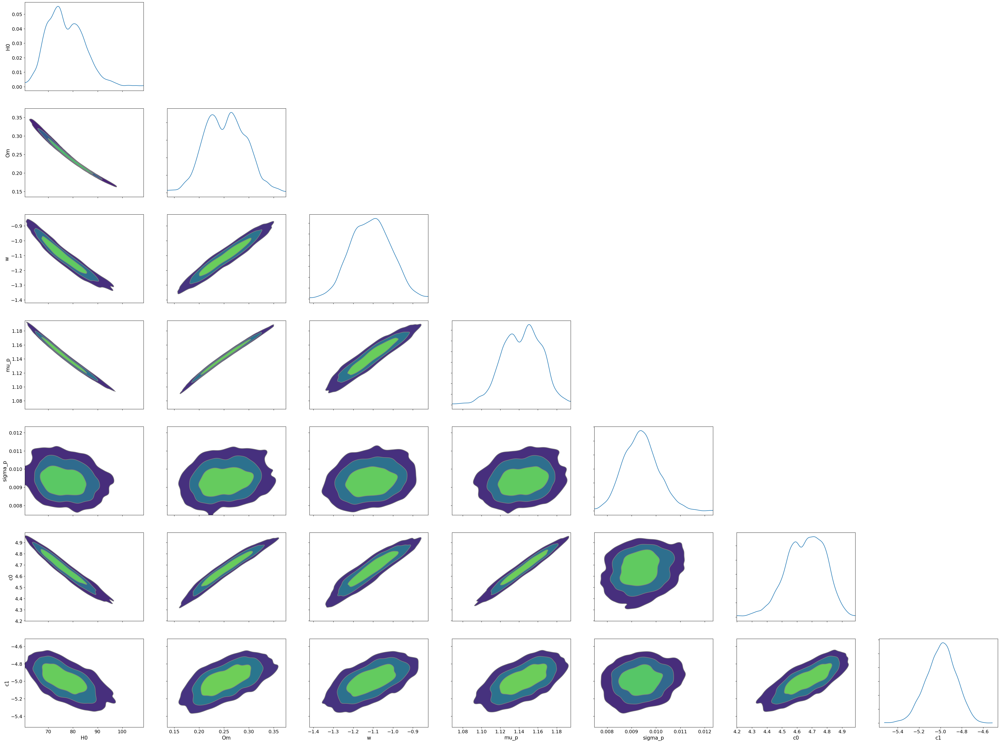

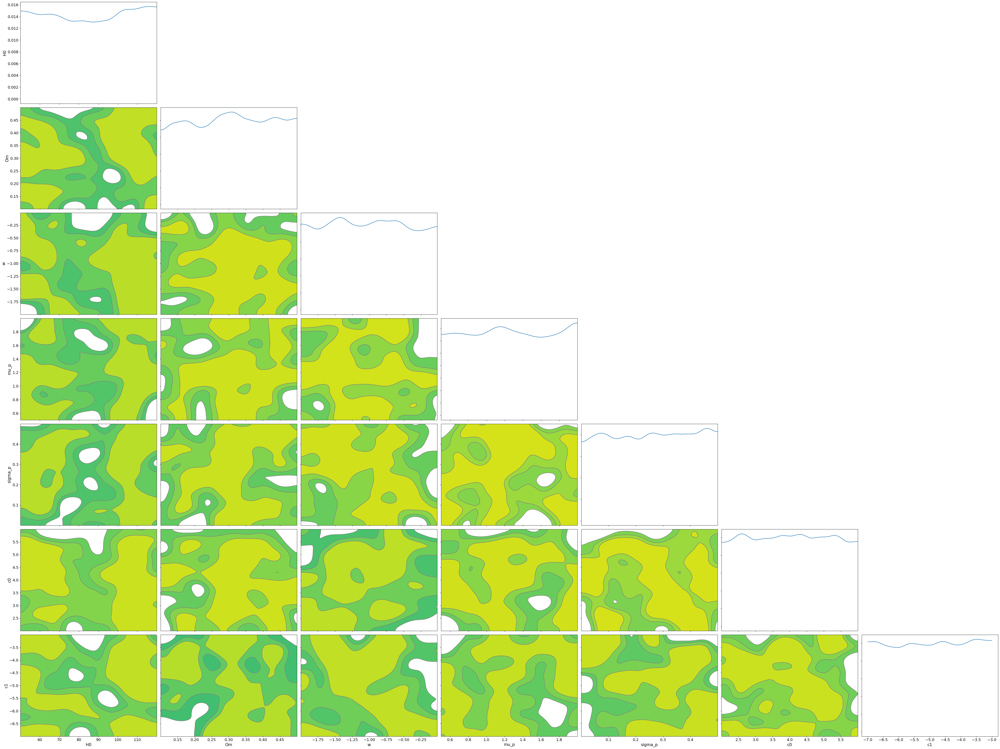

In [ ]:
#OUTPUTS
summary = az.summary(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"])
print(summary)
az.plot_pair(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"], kind="kde", marginals=True)
az.plot_pair(traceprior, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"], kind="kde", marginals=True)
plt.tight_layout()
plt.show()

           mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
H0       77.140  7.500  63.913   90.317      0.320    0.223     557.0   
Om        0.253  0.041   0.175    0.323      0.002    0.001     560.0   
w        -1.111  0.099  -1.281   -0.922      0.004    0.002     573.0   
mu_p      1.143  0.020   1.105    1.180      0.001    0.001     567.0   
sigma_p   0.009  0.001   0.008    0.011      0.000    0.000    1550.0   
c0        4.657  0.128   4.430    4.890      0.006    0.003     548.0   
c1       -4.995  0.139  -5.251   -4.736      0.005    0.003     763.0   

         ess_tail  r_hat  
H0          761.0   1.01  
Om          728.0   1.01  
w           970.0   1.00  
mu_p        735.0   1.01  
sigma_p    1737.0   1.00  
c0          627.0   1.01  
c1         1094.0   1.00  


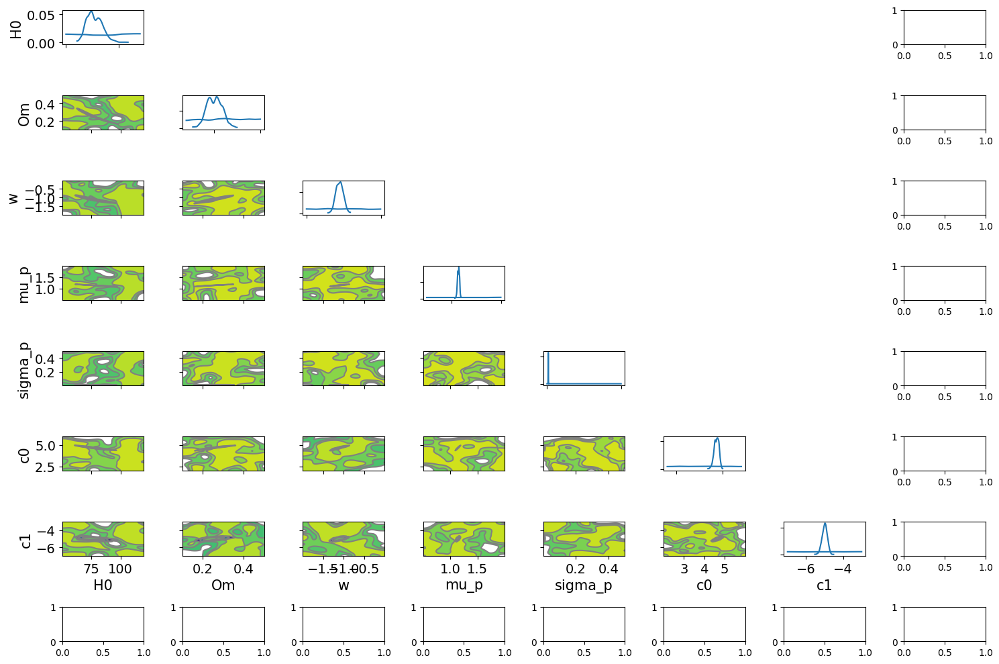

In [ ]:
#OUTPUTS
summary = az.summary(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"])
print(summary)

# Create a figure and axes for the overlaid plots
fig, axes = plt.subplots(nrows=len(trace.posterior.data_vars), ncols=len(trace.posterior.data_vars), figsize=(15, 10))

# Plot the second trace on the same axes
az.plot_pair(traceprior, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"], kind="kde", marginals=True, ax=axes)


# Plot the first trace
az.plot_pair(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"], kind="kde", marginals=True, ax=axes)


plt.tight_layout()
plt.show()

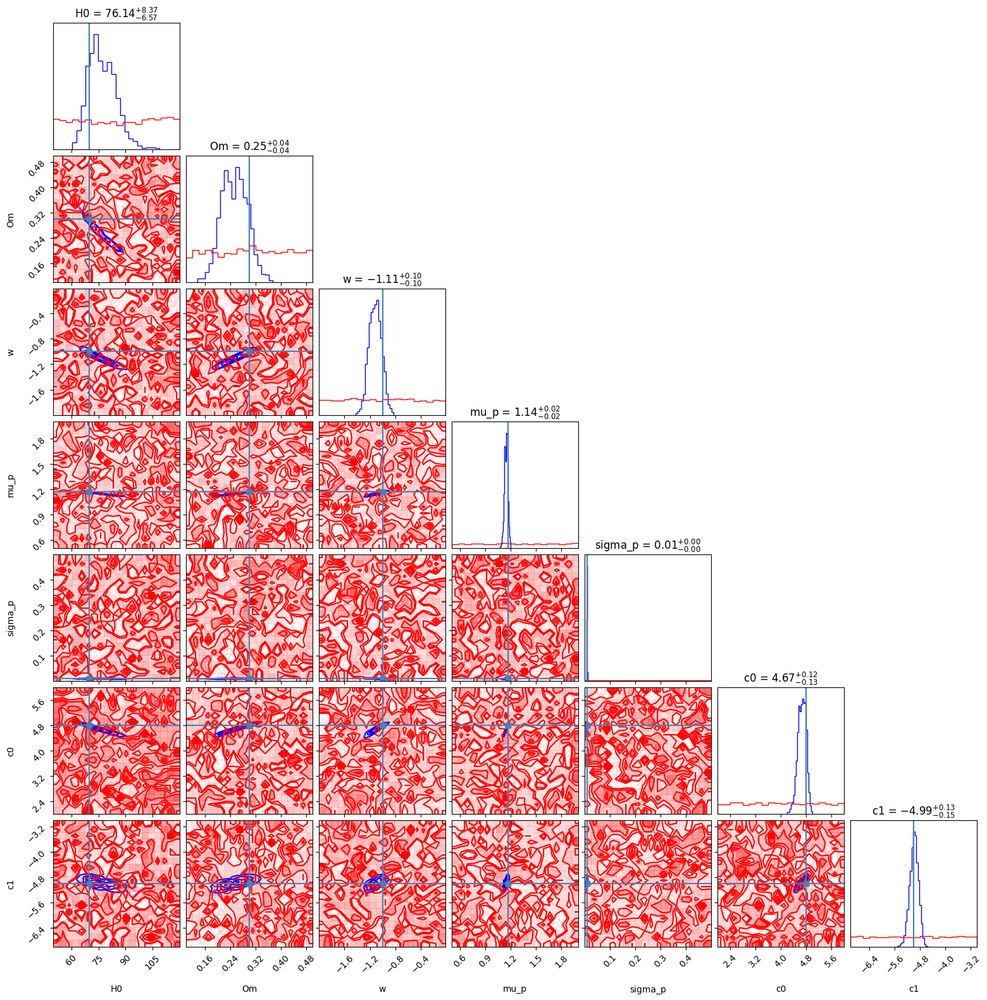

In [ ]:
import corner

# Extract the relevant parameters from the traces
trace_data = trace.posterior.stack(samples=("chain", "draw"))[["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"]].to_array().values.T
traceprior_data = traceprior.posterior.stack(samples=("chain", "draw"))[["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"]].to_array().values.T

# Define the labels and true values for the parameters
labels = ["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"]
true_values = [70.0, 0.3, -1.0, mu_p_true, sigma_p_true, c0_true, c1_true]

# Create the corner plot
figure = corner.corner(trace_data, labels=labels, show_titles=True, color="blue", hist_kwargs={"density": True}, truths=true_values)
corner.corner(traceprior_data, fig=figure, labels=labels, show_titles=False, color="red", hist_kwargs={"density": True}, truths=true_values)

plt.show()

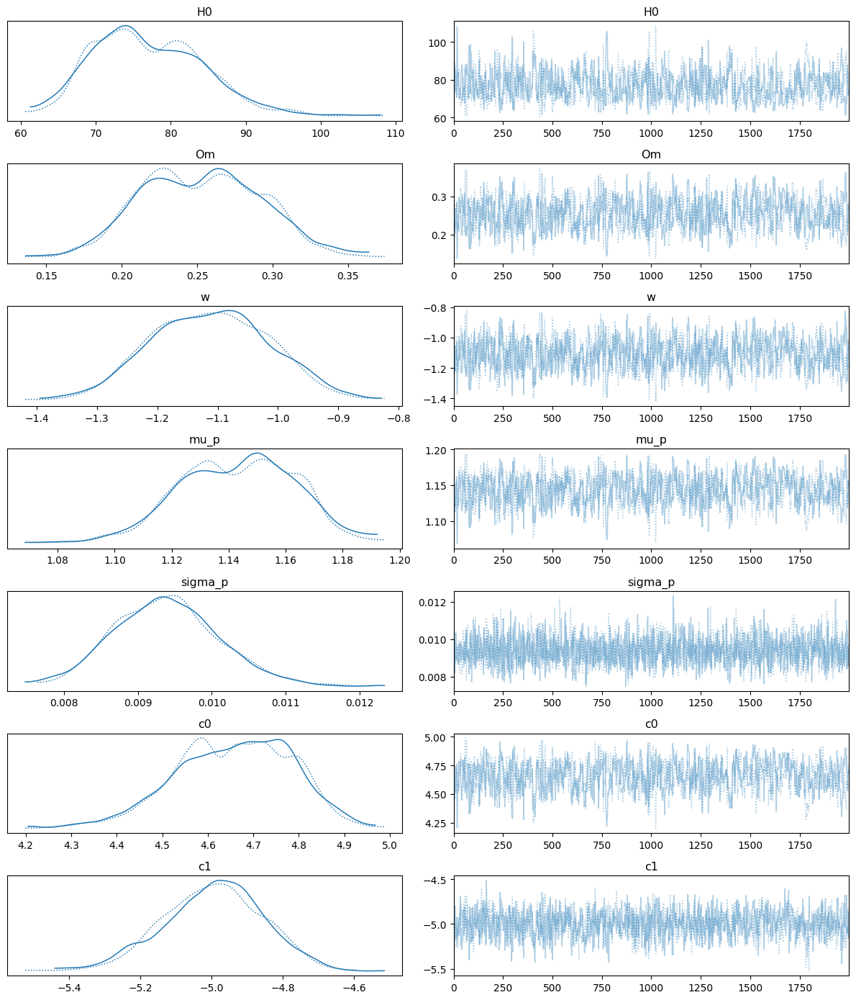

In [ ]:
az.plot_trace(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"])
plt.tight_layout()
plt.show()

           mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
H0       64.140  3.353  58.266   70.369      0.131    0.085     651.0   
Om        0.344  0.029   0.291    0.399      0.001    0.001     653.0   
w        -0.944  0.080  -1.088   -0.794      0.003    0.002     695.0   
mu_p      1.184  0.011   1.165    1.204      0.000    0.000     660.0   
sigma_p   0.011  0.001   0.009    0.012      0.000    0.000    1729.0   
c0        4.885  0.068   4.760    5.010      0.003    0.002     643.0   
c1       -4.904  0.113  -5.105   -4.683      0.004    0.002     977.0   

         ess_tail  r_hat  
H0          897.0    1.0  
Om          931.0    1.0  
w          1104.0    1.0  
mu_p        969.0    1.0  
sigma_p    1589.0    1.0  
c0          861.0    1.0  
c1         1390.0    1.0  


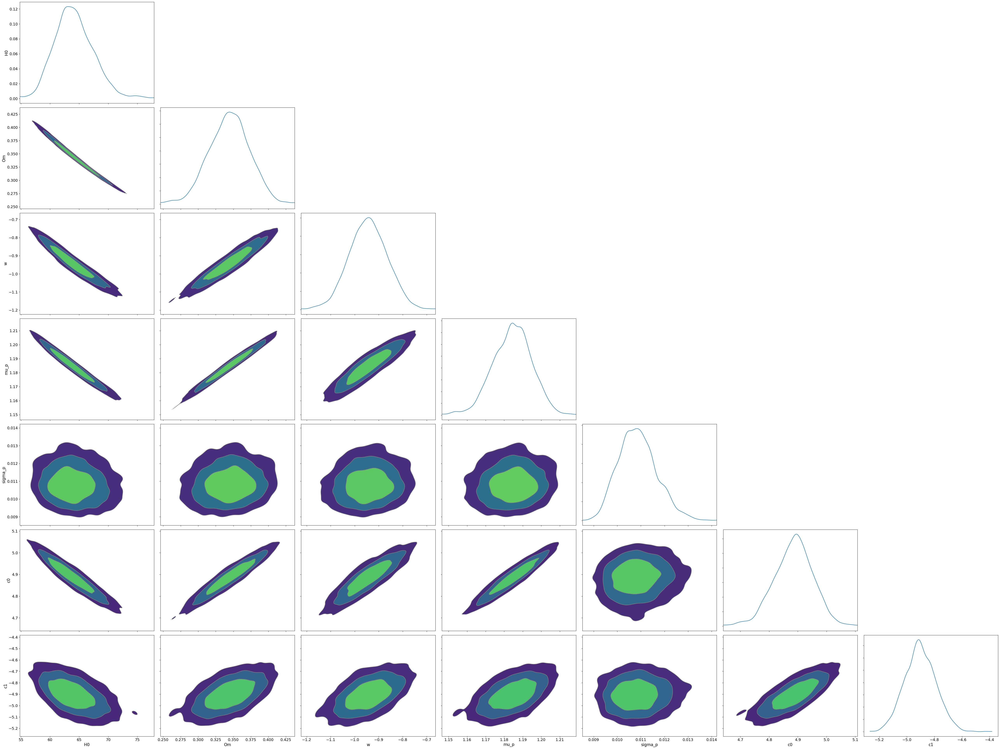

In [ ]:
#OUTPUTS
summary = az.summary(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"])
print(summary)
az.plot_pair(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"], kind="kde", marginals=True)
plt.tight_layout()
plt.show()

In [ ]:
#PYMC MODEL BLOCK # WITH USING DERIVATIVE FUNCTION

with pm.Model() as model:

    # Priors
    H0 = pm.Uniform("H0", 50.0, 120.0)
    Om = pm.Uniform("Om", 0.1, 0.5)
    w = pm.Uniform("w", -2.0, -0.01)
    wDM = 0.0

    mu_p = pm.Uniform("mu_p", 0.5, 2.0)
    sigma_p = pm.Uniform("sigma_p", 0.0, 0.5)

    c0 = pm.Uniform("c0", 2.0, 6.0)
    c1 = pm.Uniform("c1", -7, -3)

    # z grid and luminosity distance
    z_grid = pt.as_tensor_variable(z_grid_np)
    dC_grid = dCs(z_grid, Om, w, wDM)
    dL_grid = (dLs(z_grid, dC_grid) * 3e5)/H0


    #Observed data
    #DL_obs_shared = pm.Data("DL_obs", DL_obs)
    #Mz_obs_shared = pm.Data("Mz_obs", Mz_obs)
    #Lambda_obs_shared = pm.Data("Lambda_obs", Lambda_obs)

    #Interpolate z from DL
    z_interp = pt_interp(DL_obs, dL_grid, z_grid)

    #Derivative

    ddl_dz = (dDLdz(z_interp, Om, w, wDM)*3e5)/H0
    ddl_dz_safe = pt.clip(ddl_dz, 1e-12, 1e12) # reason ?
    dz_dDL = 1.0 / ddl_dz_safe


    #Source mass
    M_source = Mz_obs / (1.0 + z_interp)

    #Lambda
    Lambda_pred = c0 + c1 * ((M_source - 1.4) / 1.0)

    #pm.Deterministic("z_interp", z_interp)
    #pm.Deterministic("dz_dDL", dz_dDL)
    #pm.Deterministic("Lambda_pred", Lambda_pred)

    #Log-likelihood
    logL1 = pm.logp(pm.Normal.dist(mu=Lambda_pred, sigma=sigma_lambda), Lambda_obs)
    logL2 = -pt.log1p(z_interp)
    logL3 = pt.log(dz_dDL)#-pt.log(ddl_dz)
    z_clipped = (z_interp/10)
    logL4 = pm.logp(pm.Beta.dist(3, 9), z_clipped)
    logL5 = pm.logp(pm.Normal.dist(mu=mu_p, sigma=sigma_p), M_source)


    total_loglike = logL1 + logL2 + logL3 + logL4 + logL5 # need to do exponential pt.exp() before total loglike
    pm.Potential("loglike", pt.sum(total_loglike))# pt.logsumexp()


    initvals = {
        "H0": 70.0,
        "Om": 0.3,
        "w": -1.0,
        "mu_p": 1.17,
        "sigma_p": 0.1,
        "c0": 4.8,
        "c1": -5.0,
    }
    #print(model.initial_point())
    #print(model.compile_logp()(model.initial_point()))



    trace = pm.sample(2000, tune=1000, chains=2, target_accept=0.95, initvals=initvals) # keep tuning same as sample
##schwarchild black hole

Output()

           mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
H0       65.154  3.608  58.806   71.764      0.156    0.130     548.0   
Om        0.335  0.029   0.281    0.389      0.001    0.001     550.0   
w        -0.939  0.083  -1.092   -0.789      0.003    0.002     586.0   
mu_p      1.177  0.011   1.156    1.198      0.000    0.000     555.0   
sigma_p   0.010  0.001   0.009    0.011      0.000    0.000    1541.0   
c0        4.829  0.076   4.693    4.973      0.003    0.002     562.0   
c1       -5.046  0.122  -5.264   -4.809      0.004    0.002    1075.0   

         ess_tail  r_hat  
H0          942.0   1.01  
Om          983.0   1.01  
w          1054.0   1.00  
mu_p       1031.0   1.01  
sigma_p    1793.0   1.00  
c0          847.0   1.01  
c1         1674.0   1.00  


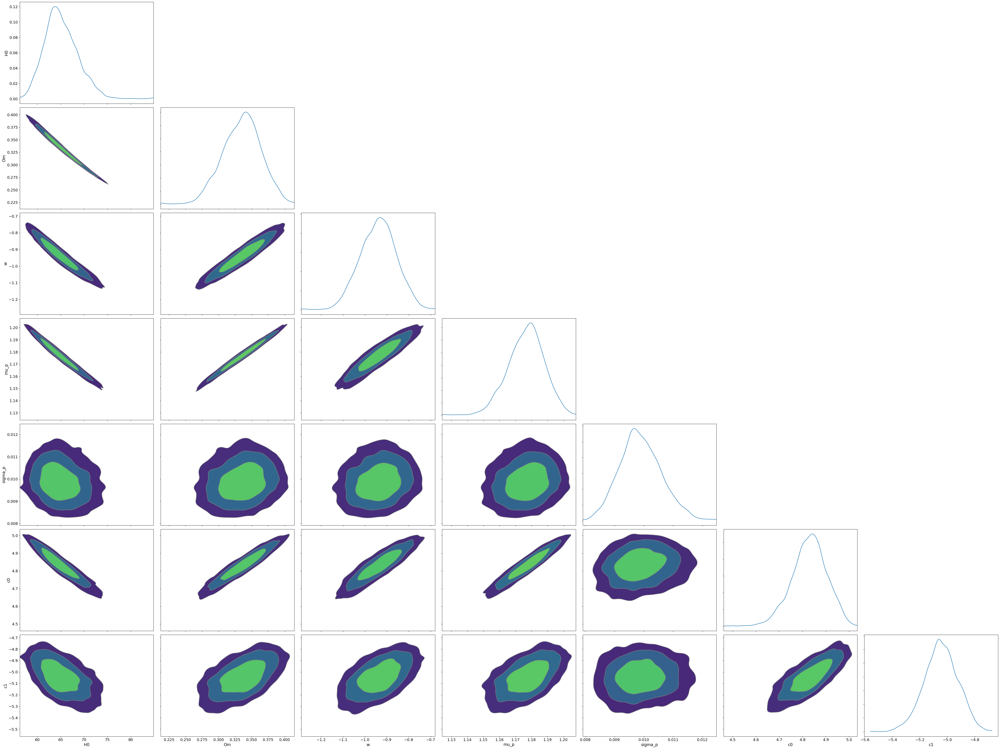

In [ ]:
#OUTPUTS
summary = az.summary(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"])
print(summary)
az.plot_pair(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"], kind="kde", marginals=True)
plt.tight_layout()
plt.show()

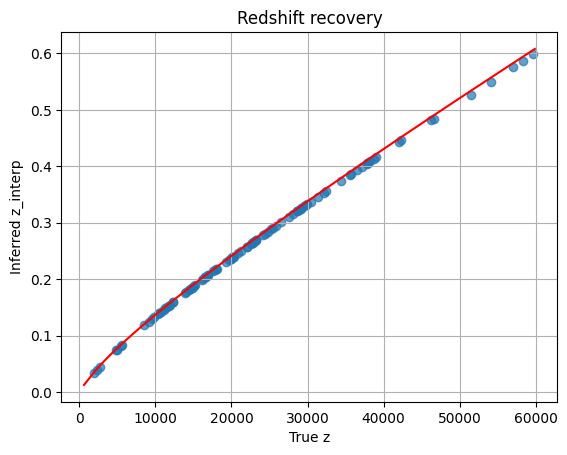

In [ ]:
posterior_z = trace.posterior["z_interp"].stack(draws=("chain", "draw")).mean("draws")
plt.scatter(DL_obs, (posterior_z/10.0), alpha=0.7)
zt = np.random.beta(3,9,Nobs) * 10
zt = np.sort(zt)
DLT = cosmo.luminosity_distance(zt).to(u.Mpc).value
plt.plot(DLT,(zt/10.0) , color = 'r')
#plt.plot(posterior_z, DLT, "--", color="gray")
plt.xlabel("True z")
plt.ylabel("Inferred z_interp")
plt.title("Redshift recovery")
plt.grid(True)
#plt.ylim(0,6)
#plt.xlim(0,60000)
plt.show()

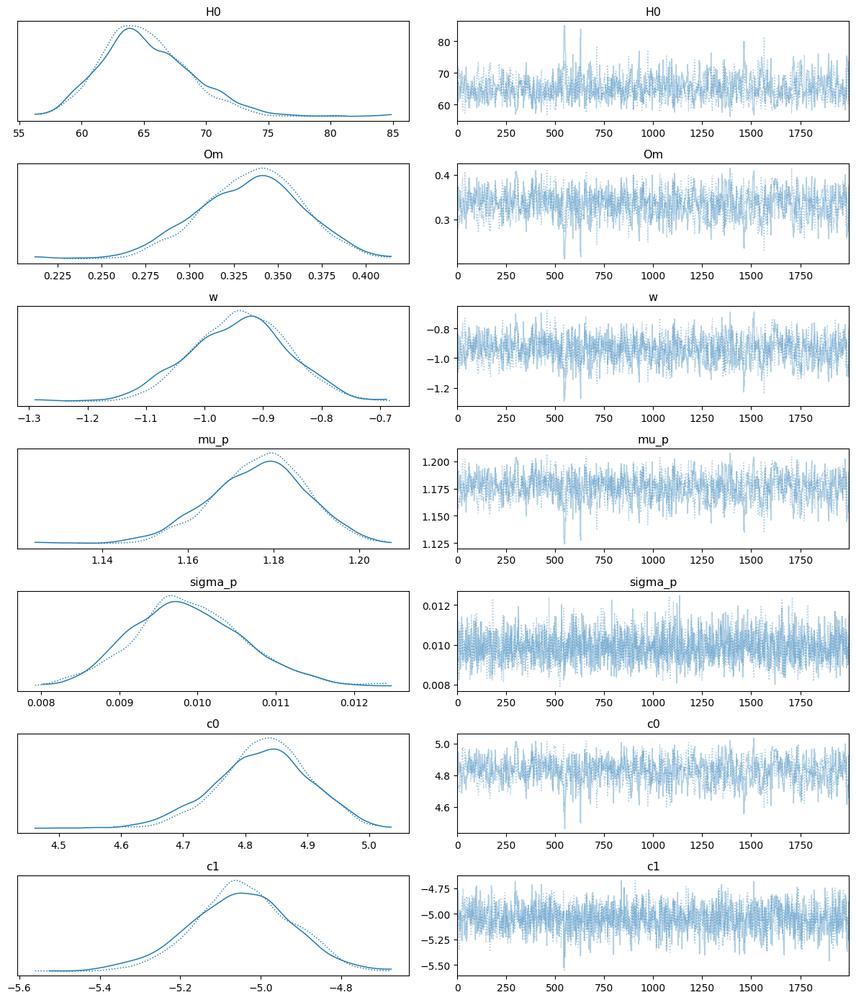

In [ ]:
az.plot_trace(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"])
plt.tight_layout()
plt.show()

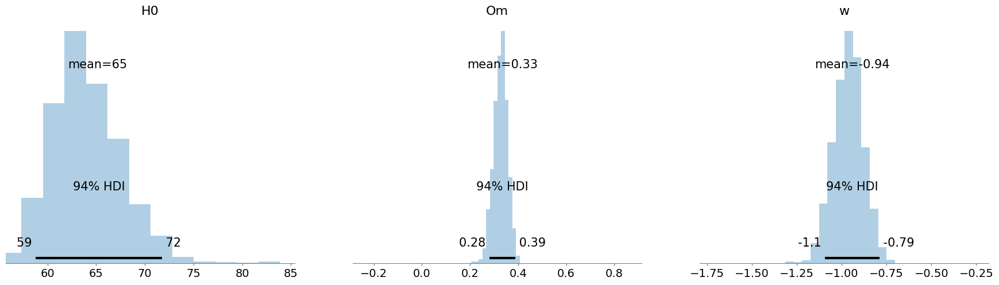

In [ ]:
az.plot_posterior(trace, var_names=["H0", "Om", "w"], kind="hist",
                  point_estimate="mean", hdi_prob=0.94)
x = np.linspace(50, 120, 100)
plt.plot(x, np.ones_like(x), label="Uniform Prior", linestyle="--")


Output()

          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
H0       0.673  0.029   0.623    0.729      0.001    0.000    2102.0   
Om       0.317  0.021   0.277    0.356      0.000    0.000    2126.0   
w       -1.011  0.076  -1.153   -0.868      0.002    0.001    2292.0   
mu_p     1.174  0.008   1.159    1.188      0.000    0.000    2187.0   
sigma_p  0.010  0.001   0.009    0.012      0.000    0.000    7302.0   
c0       4.844  0.050   4.748    4.936      0.001    0.001    2385.0   
c1      -4.864  0.107  -5.066   -4.666      0.001    0.001    5552.0   

         ess_tail  r_hat  
H0         3501.0    1.0  
Om         3564.0    1.0  
w          4216.0    1.0  
mu_p       3726.0    1.0  
sigma_p    7302.0    1.0  
c0         4263.0    1.0  
c1         7030.0    1.0  


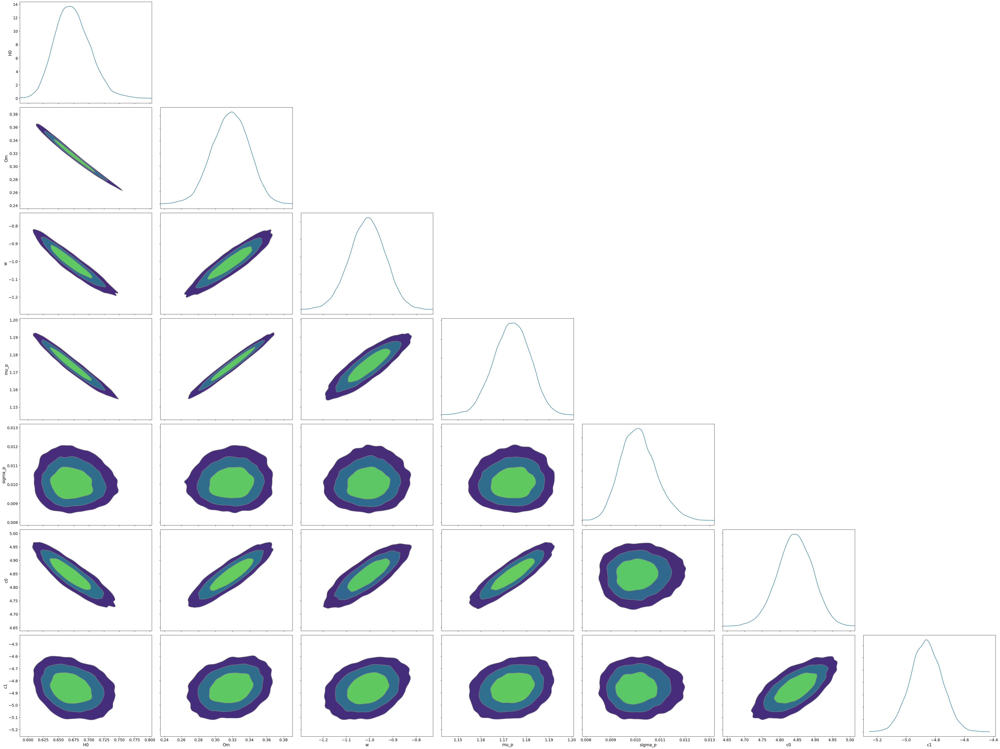

In [ ]:
import pymc as pm
import pytensor.tensor as pt
import pytensor.tensor.extra_ops as pte
import numpy as np
from scipy.stats import beta
from pytensor import grad
import matplotlib.pyplot as plt
import arviz as az
from astropy.cosmology import Planck18 as cosmo
from astropy import units as u


def Ez(z, Om, w, wDM):
    opz = 1 + z
    return pt.sqrt(Om*opz**(3*(1+wDM)) + (1-Om)*opz**(3*(1+w)))


def dCs(zs, Om, w, wDM):
    dz = zs[1:] - zs[:-1]
    fz = 1 / Ez(zs, Om, w, wDM)
    I = 0.5 * dz * (fz[:-1] + fz[1:])
    return pt.concatenate([pt.as_tensor([0.0]), pt.cumsum(I)])

def dLs(zs, dCs):
    return dCs * (1 + zs)

def dDLdz(zs, Om, w, wDM):
    dc_vals = dCs(zs, Om, w, wDM)
    ez_vals = Ez(zs, Om, w, wDM)
    return dc_vals + (1 + zs) / ez_vals

def pt_interp(x, xs, ys):
    x = pt.as_tensor(x)
    xs = pt.as_tensor(xs)
    ys = pt.as_tensor(ys)
    ind = pte.searchsorted(xs, x)
    ind = pt.clip(ind, 1, xs.shape[0] - 1)
    r = (x - xs[ind - 1]) / (xs[ind] - xs[ind - 1])
    return r * ys[ind] + (1 - r) * ys[ind - 1]

#Mock data
Nobs = 100
z_true = np.random.beta(3,9,Nobs) * 10
DL_true = cosmo.luminosity_distance(z_true).to(u.Gpc).value
mu_p_true = 1.17
sigma_p_true = 0.01
M_source_true = np.random.normal(mu_p_true, sigma_p_true, size=Nobs)
Mz_true = (1 + z_true) * M_source_true
c0_true = 4.8
c1_true = -5.0
Lambda_true = c0_true + c1_true * ((M_source_true - 1.4) / 1.0)
sigma_lambda = 0.01
Lambda_obs = np.random.normal(Lambda_true, sigma_lambda)
DL_obs = DL_true
Mz_obs = Mz_true

#Redshift grid (numeric)
z_grid_np = np.linspace(1e-4, 10.0, 100).astype(np.float32)


with pm.Model() as model:

    # Priors
    H0 = pm.Uniform("H0", 0.5, 1.20)
    Om = pm.Uniform("Om", 0.1, 0.5)
    w = pm.Uniform("w", -2.0, -0.01)
    wDM = 0.0

    mu_p = pm.Uniform("mu_p", 0.5, 2.0)
    sigma_p = pm.Uniform("sigma_p", 0.0, 0.5)

    c0 = pm.Uniform("c0", 3.0, 6.0)
    c1 = pm.Uniform("c1", -7.0, -3.0)

    # z grid and luminosity distance
    z_grid = pt.as_tensor_variable(z_grid_np)
    dC_grid = dCs(z_grid, Om, w, wDM)
    dL_grid = (dLs(z_grid, dC_grid) * 2.99792)/H0

    #Interpolate z from DL
    z_interp = pt_interp(DL_obs, dL_grid, z_grid)

    #Derivative

    ddl_dz = (dDLdz(z_interp, Om, w, wDM)*2.99792)/H0
    dz_dDL = 1.0 / ddl_dz

    #Source mass
    M_source = Mz_obs / (1.0 + z_interp)

    #Lambda
    Lambda_pred = c0 + c1 * ((M_source - 1.4) / 1.0)

    # Likelihoods defined directly using pm.Normal and pm.Potential for other terms
    pm.Normal("lambda_likelihood", mu=Lambda_pred, sigma=sigma_lambda, observed=Lambda_obs)
    pm.Potential("Msource_population_prior", pt.sum(pm.logp(pm.Normal.dist(mu=mu_p, sigma=sigma_p), M_source)))
    pm.Potential("beta_prior_on_z", pt.sum(pm.logp(pm.Beta.dist(3, 9), (z_interp/10))))
    pm.Potential("jacobian_term", pt.sum(pt.log(dz_dDL) - pt.log1p(z_interp)))


    initvals = {
        "H0": 0.7,
        "Om": 0.3,
        "w": -1.0,
        "mu_p": 1.17,
        "sigma_p": 0.1,
        "c0": 4.8,
        "c1": -5.0,
    }

    trace = pm.sample(8000, tune=2000, chains=2, target_accept=0.99, initvals=initvals)

summary = az.summary(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"])
print(summary)
az.plot_pair(trace, var_names=["H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1"], kind="kde", marginals=True)
plt.tight_layout()
plt.show()

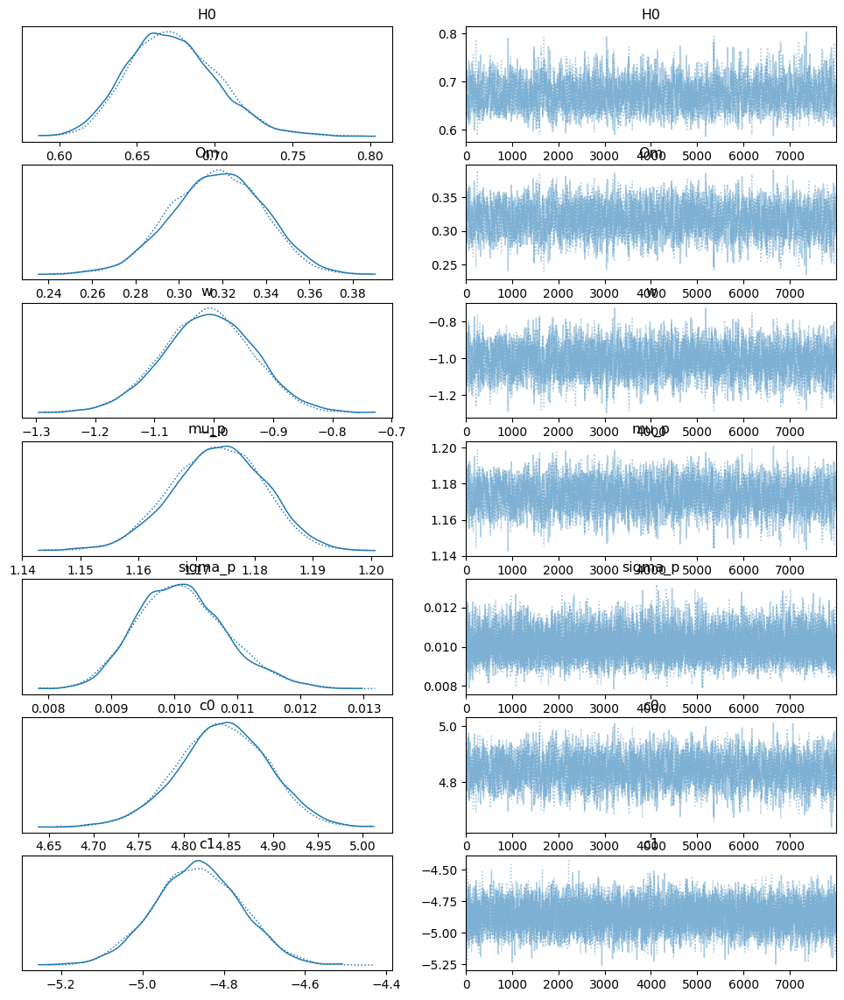

In [ ]:
az.plot_trace(trace, var_names=["H0","Om","w", "mu_p", "sigma_p","c0","c1"])
plt.show()

###Next Step

Introducing, noise to DL (later try adding mass ratio and then add correlation, the problem is computation speed)

Due to added noise in Observed Luminosity Distance parameter constraining might be problematic for Lambda Tilde. So some formula changes or re-centering while sampling might be required.